# Task 1: Filters Visualization
## 1.1 - Load VGG16
We are loading a (pretrained) VGG16 via torchvision

In [104]:
import numpy as np
import matplotlib.pyplot as plt

import os
import torch
from torch.optim import Adam
from torchvision import models

from filters_visualization import visualise_layer_filter
from aux_ops import preprocess_image, recreate_image

RESULTS_DIR = 'results'

In [105]:
# Initialize GPU if available
use_gpu = False
if torch.cuda.is_available():
    use_gpu = True
# Select device to work on.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# 1.1 load the pretrained VGG16 network
model = models.vgg16(pretrained=True)

/Users/janinaalicamattes/miniforge3/envs/pytorch-py11/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/janinaalicamattes/miniforge3/envs/pytorch-py11/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## 1.2 - Optimize input image


In [106]:
# Change the input image values in order to maximize output activation
# Print the shape, mean, minimum and maximum of the intermediate network-activations

layer_nmbr = 28
filter_nmbr = 228

# Fully connected layer is not needed
model = models.vgg16(pretrained=True).features
model.eval()

# Fix model weights
for param in model.parameters():
    param.requires_grad = False
# Enable GPU
if use_gpu:
    model.cuda()

# use this output in some way
optimized_img = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=filter_nmbr)


/Volumes/Work Disk Janina Mattes/DEV/University/GAI/GAI-Visual-Synthesis/05_exercise/filters_visualization.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


## Task 1.3 - Visualize a random filter.

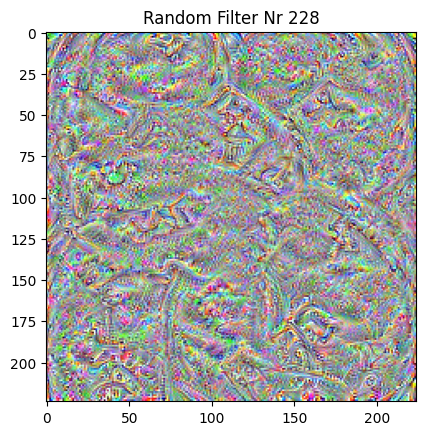

In [107]:
# Visualize a random filter.
# plot filter
plt.imshow(optimized_img)
plt.title('Random Filter Nr {}'.format(filter_nmbr))
plt.savefig(os.path.join(RESULTS_DIR, 'filter_{}_{}.png'.format(layer_nmbr, filter_nmbr)))
plt.show()

## Task 1.4 - Visualize filters at different layers.

In [108]:
# Visualize filters at different layers.
selected_layer_numbers = [2, 4, 8, 16, 35, 122, 348, 420, 499]
selected_filter_numbers = [2, 4, 8, 16, 35, 122, 348, 420, 499]
collect_filters = []

for layer_nmbr, filter_nmbr in zip(selected_layer_numbers, selected_filter_numbers):
    optimized_img = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=filter_nmbr)
    collect_filters.append(optimized_img)

In [109]:
# Calculate the number of rows needed for the grid

def plot_filters(collect_filters, selected_layer_numbers, selected_filter_numbers, plt_name='filter_grid.png'):
    # Set the number of columns and rows
    n_cols = 3
    n = len(collect_filters)
    n_rows = (n - 1) // n_cols + 1

    # Plot filters in a grid
    plt.figure(figsize=(20, 20))
    for i, img in enumerate(collect_filters):
        # Adjust the subplot parameters to plot three images in one row
        plt.subplot(n_rows, n_cols, i + 1)
        plt.title('Filter of Layer {}, Filter No'.format(selected_layer_numbers[i], selected_filter_numbers[i]))
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    plt.savefig(os.path.join(RESULTS_DIR, plt_name))
    plt.show()

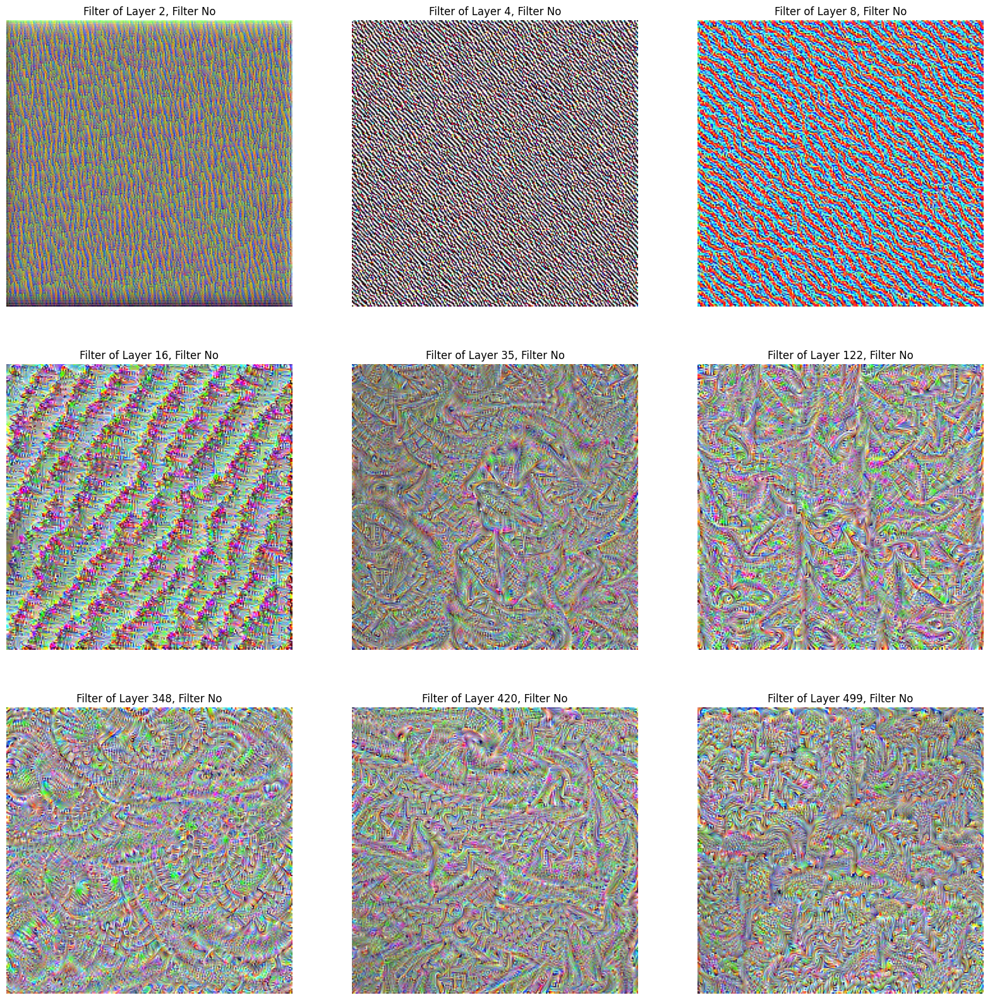

In [110]:
plot_filters(collect_filters, selected_layer_numbers, selected_filter_numbers)

**What do you observe going from earlier layers to later layers?**

* In the earlier layers of the pre-trained network, filters were learned that mainly represent local, simple and common visual elements such as edges, corners, and textures.  These elements are often low-level and specific to the input images.

* In later layers filters were learned that represent more complex and abstract visual concepts such as shapes, objects, and their spatial relationships. Such concepts are often high-level and can be comprised to global features of the input images.

* The receptive field of the filters, which is the region of the input image that affects the output of the filter, increases seemingly with later layers. This allows the later filters to capture more contextual information and long-range dependencies in the input images.

* Thereby, the hierarchical nature of the convolutional neural network enables the network to learn a rich and diverse set of features at different levels of abstraction.

## Task 1.5 - Hyperparameter tuning.


In [111]:
layer_nmbr = 28
filter_nmbr = 228

num_optim_steps = [8, 14, 26, 50, 85]
collect_filters = []

for steps in num_optim_steps:
    optimized_img = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=filter_nmbr, num_optim_steps=steps)
    collect_filters.append(optimized_img)


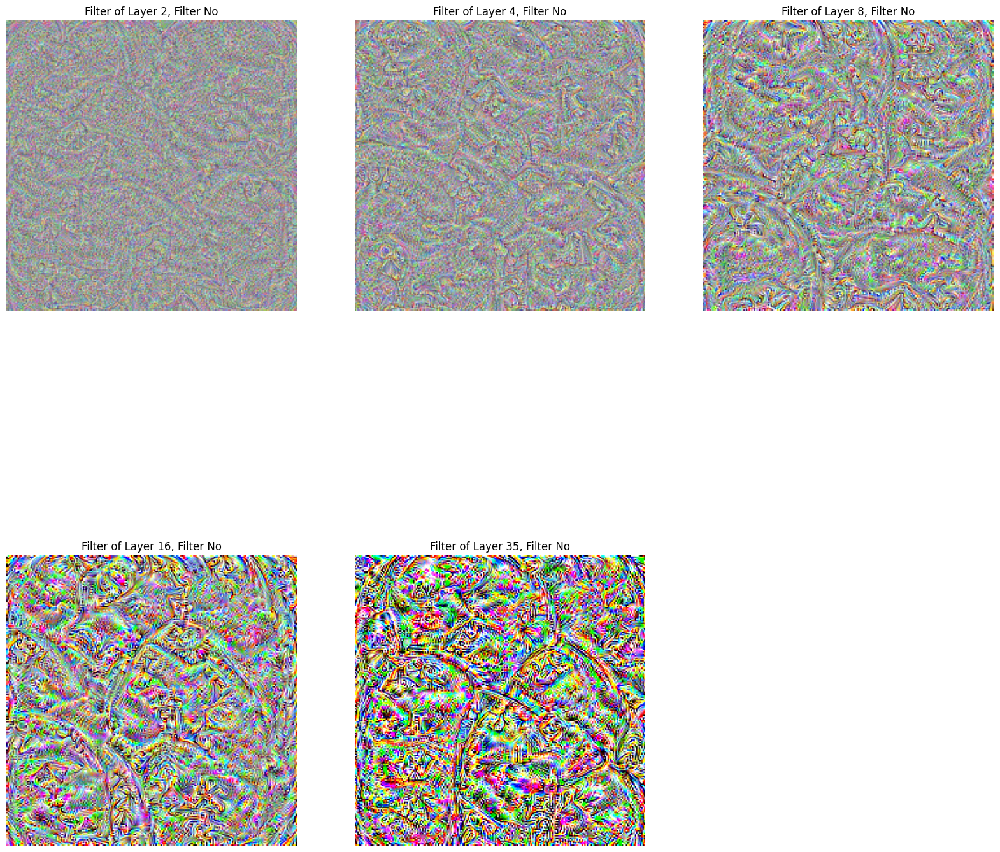

In [112]:
plot_filters(collect_filters, selected_layer_numbers, selected_filter_numbers)

In [113]:
num_learning_rates = [0.1, 0.01, 0.001, 0.0001, 0.00001]
collect_filters = []

for lr in num_learning_rates:
    optimized_img = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=filter_nmbr, lr=lr)
    collect_filters.append(optimized_img)

TypeError: visualise_layer_filter() got an unexpected keyword argument 'learning_rate'

In [ ]:
plot_filters(collect_filters, selected_layer_numbers, selected_filter_numbers)

In [ ]:
num_optim_types = ['adam', 'sgd', 'rmsprop', 'adagrad', 'adadelta']
collect_filters = []

for optim_type in num_optim_types:
    optimized_img = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=filter_nmbr, optim_type=optim_type)
    collect_filters.append(optimized_img)

In [ ]:
plot_filters(collect_filters, selected_layer_numbers, selected_filter_numbers)

**What do you observe?**
- ,,,, 


## Task 1.6 - Pretrained weights.


In [ ]:
# TODO: add your code here

# Task 2: Deep Dream

## Task 1.1 Most activated filters for every image

In [ ]:
# TODO: add your code here

## Task 1.2 Total variation loss.

In [ ]:
# TODO: add your code here

## Task 1.3 Deep dream.

In [ ]:
# TODO: add your code here